In [ ]:
!pip install pandas
!pip install scikit-learn
!pip install seaborn
!pip install umap-learn
!pip install cartopy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 1.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 4.5 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86832 sha256=2d24a797ccb27d7bbbb57809e10b2f4c1e600c0700ba2d0f7d077ef5e3e5f6a8
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
Successfully built umap-learn
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 47.4 MB/s eta 0:00:00


In [ ]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from cartopy.io.img_tiles import OSM
import os
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import seaborn as sns
from google.colab import drive
import matplotlib.pyplot as plt
import numpy as np
from umap import UMAP  # Assurez-vous d'avoir la bibliothèque umap-learn installée
from sklearn.preprocessing import LabelEncoder

In [ ]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
lon_min, lon_max, lat_min, lat_max = 0, 3, 41, 44

# Chemin vers le dossier "Valeurs acoustiques"
dossier_valeurs_acoustiques = "/content/gdrive/MyDrive/Valeurs acoustiques"

# Parcourir les dossiers "2022" et "2023"
annees = ["2022", "2023"]

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Antras_Isard/Antras_IsardL_E_B_R_acoustic_indices.csv trouvé !


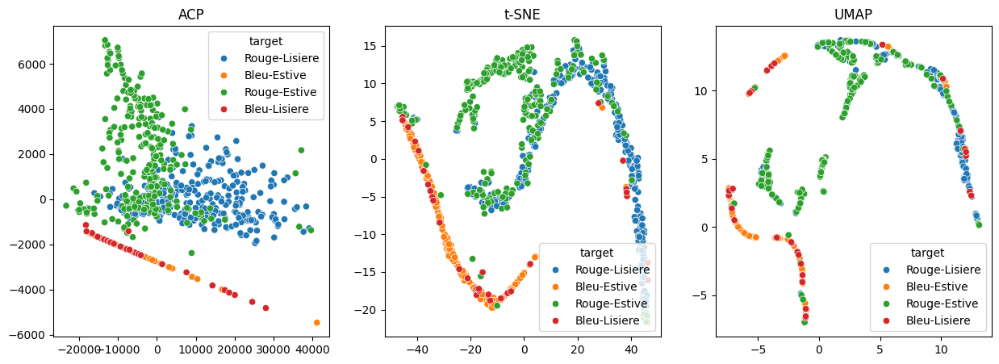

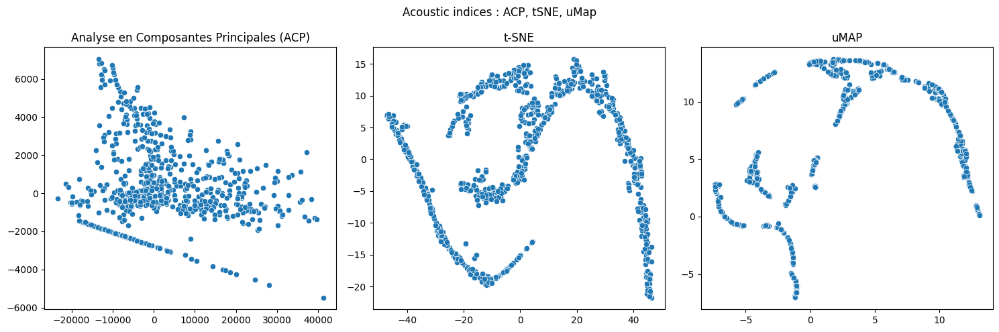

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Orgeix_Coume/Orgeix_CoumeL_E_B_R_acoustic_indices.csv trouvé !


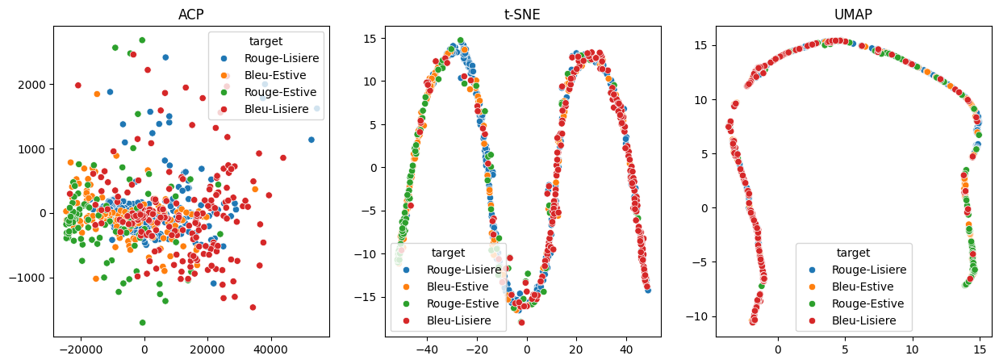

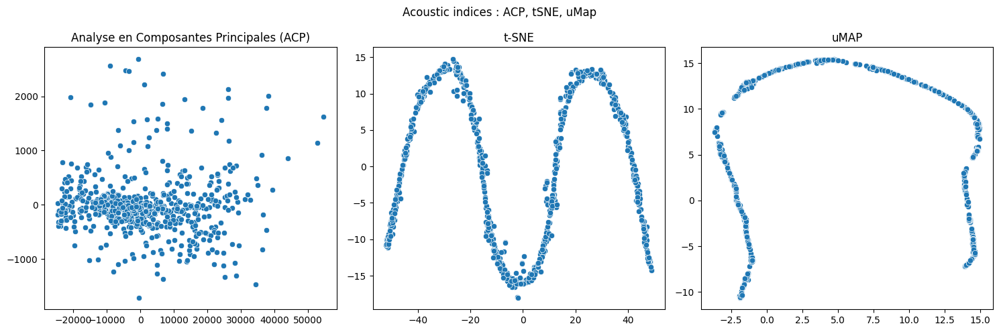

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Montségur_Soularac/Montségur_SoularacL_E_B_R_acoustic_indices.csv trouvé !


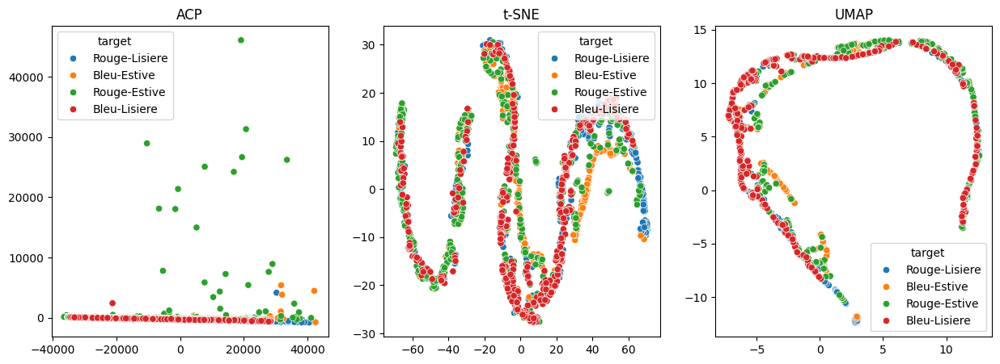

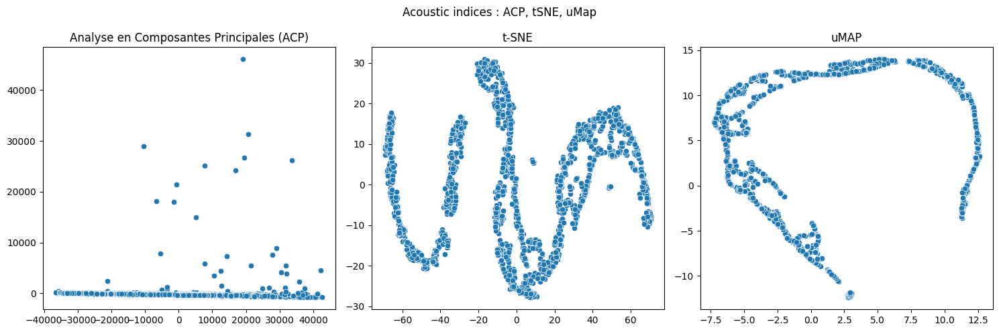

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Orlu_RNCFS/Orlu_RNCFSL_E_B_R_acoustic_indices.csv trouvé !


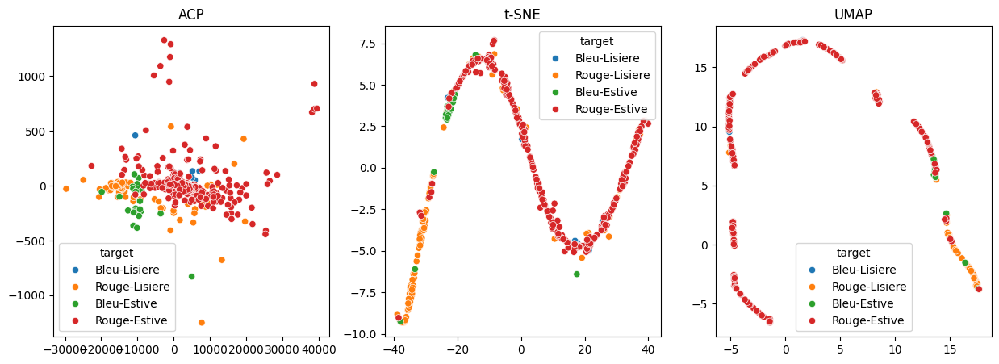

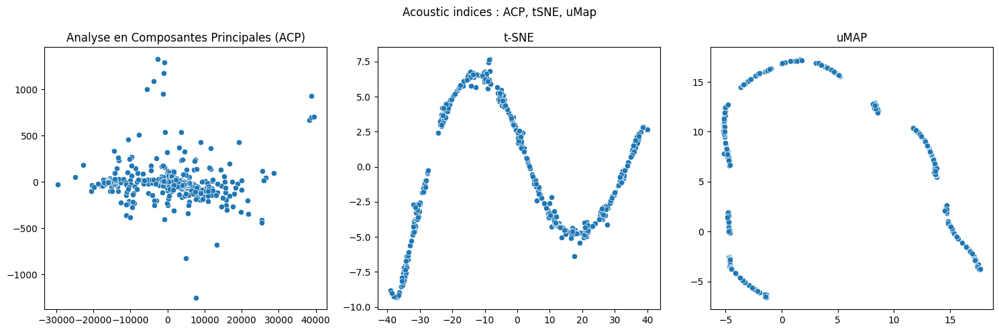

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Seix_Col_de_Pause/Seix_Col_de_PauseL_E_B_R_acoustic_indices.csv trouvé !


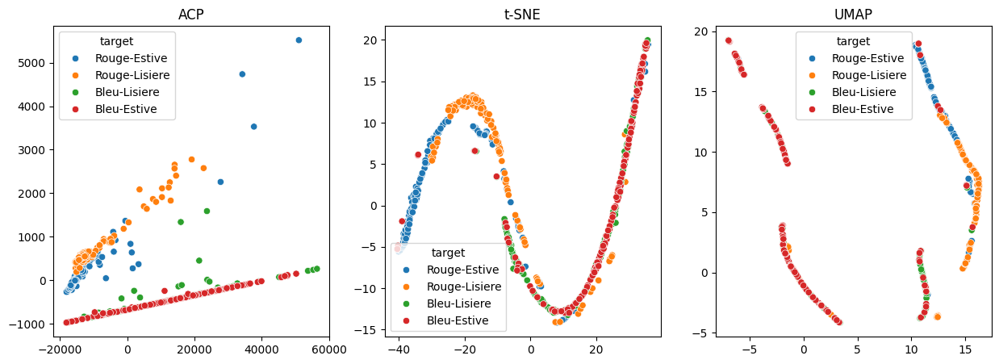

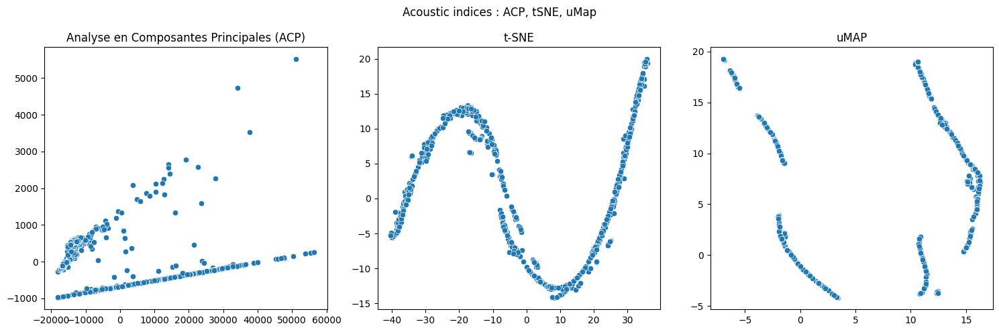

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Mijanes_Trabesses/Mijanes_TrabessesL_E_B_R_acoustic_indices.csv trouvé !


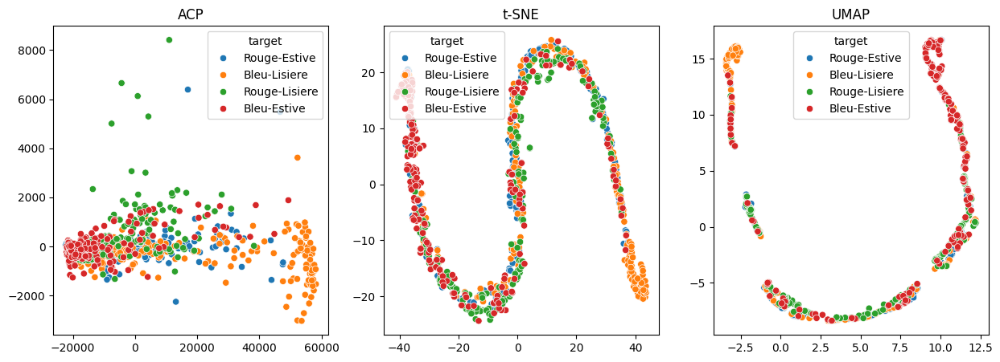

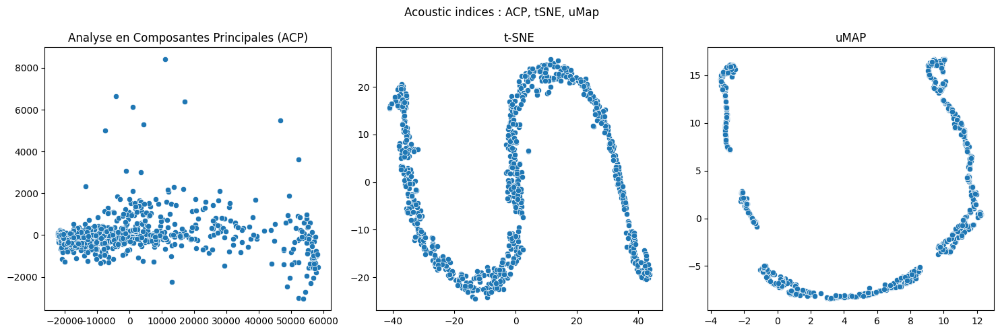

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Ustou_Guzet-Neige/Ustou_Guzet-NeigeL_E_B_R_acoustic_indices.csv trouvé !


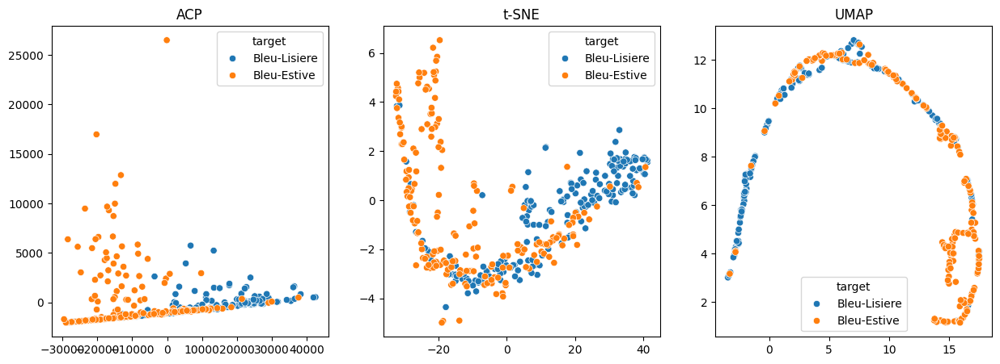

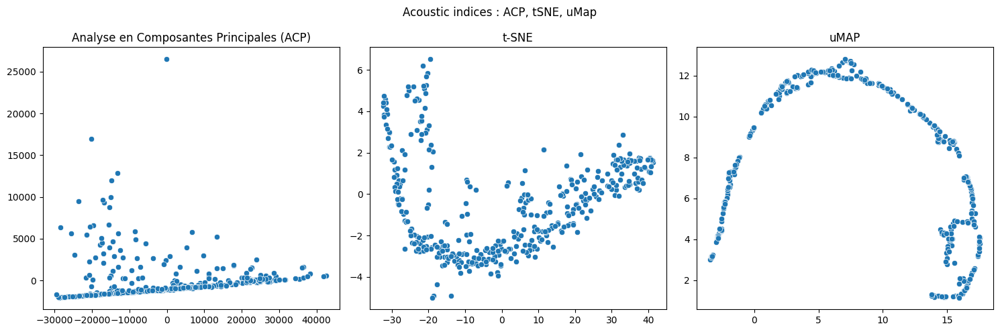

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Sentein_Eylie/Sentein_EylieL_E_B_R_acoustic_indices.csv trouvé !


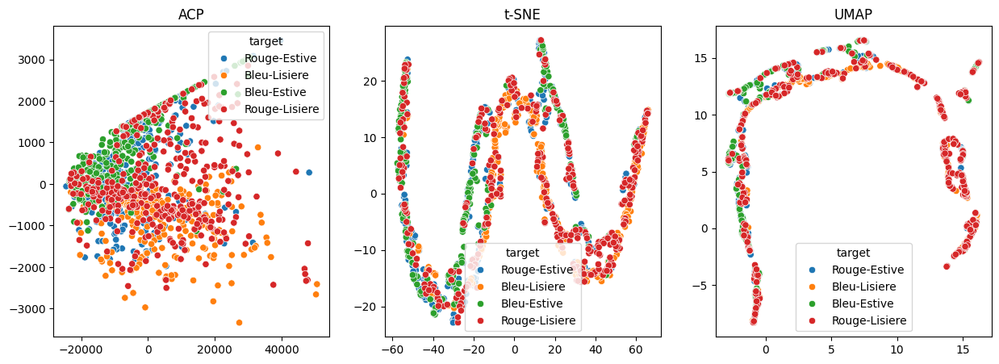

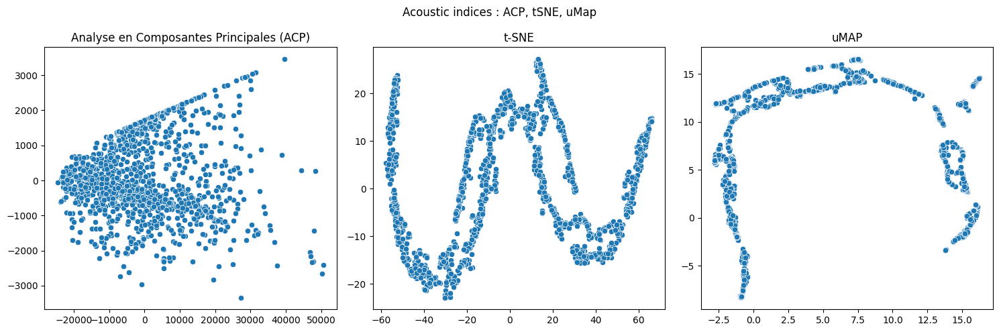

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Bethmale_Eychelle/Bethmale_EychelleL_E_B_R_acoustic_indices.csv trouvé !


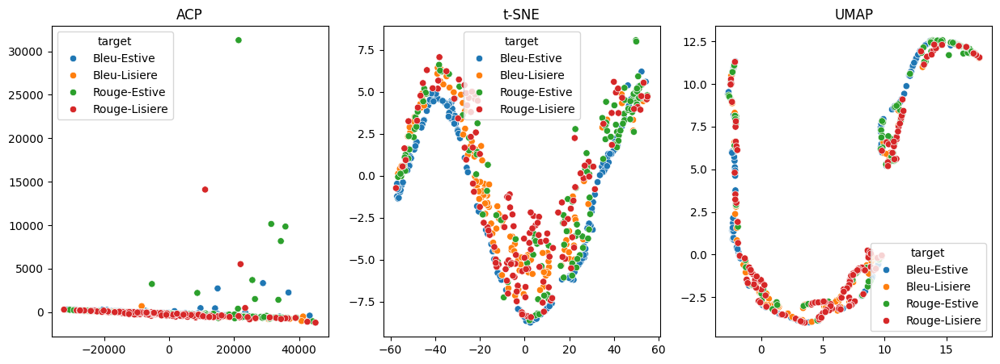

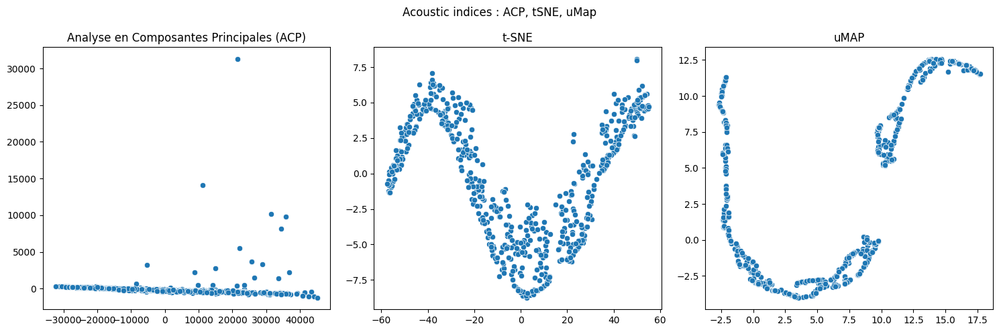

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Bonac_Orle/Bonac_OrleL_E_B_R_acoustic_indices.csv trouvé !


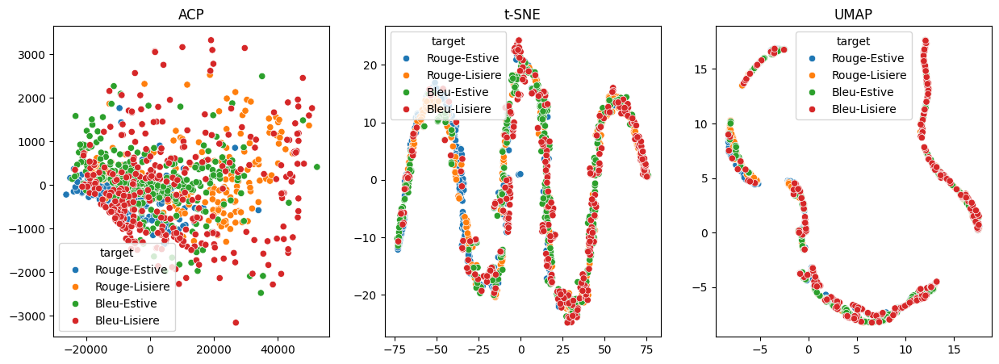

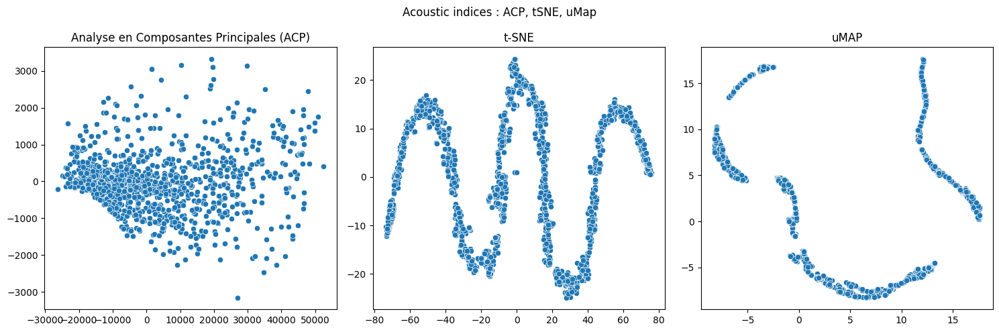

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Ascou_Pailheres/Ascou_PailheresL_E_B_R_acoustic_indices.csv trouvé !


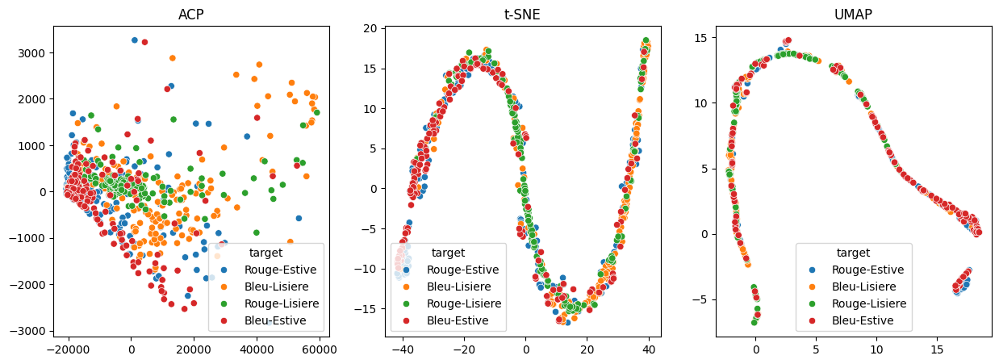

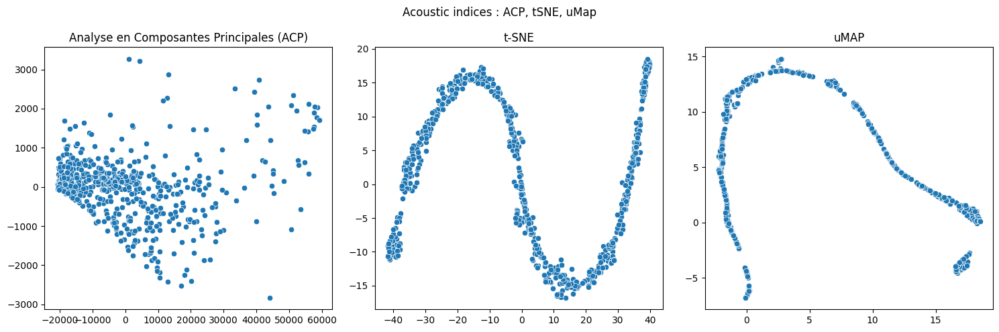

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Merens_Comte/Merens_ComteL_E_B_R_acoustic_indices.csv trouvé !


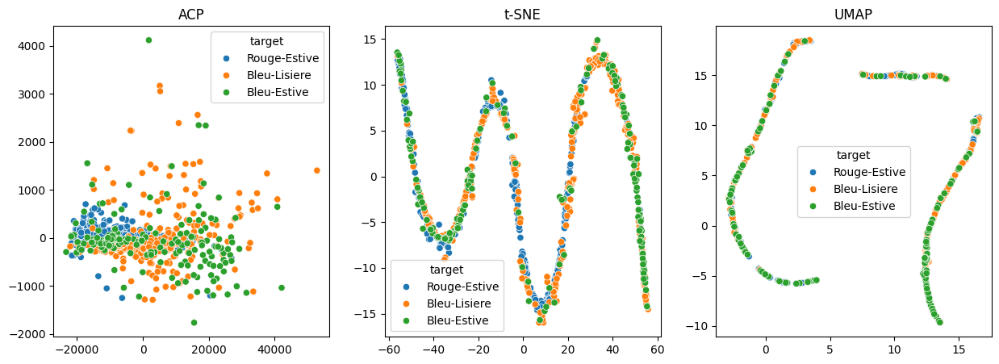

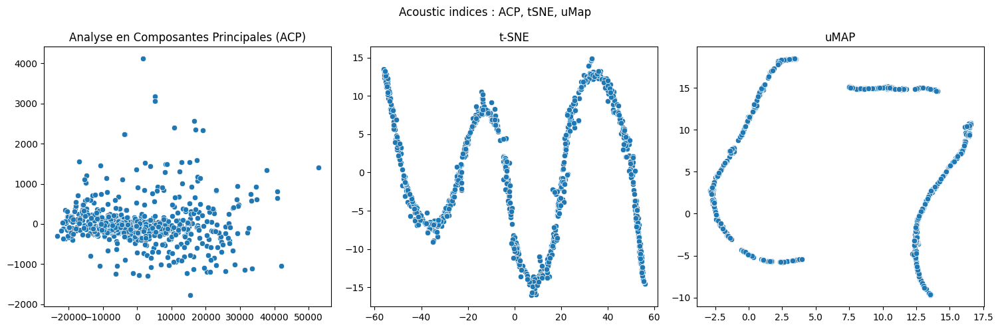

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Bestiac_Trimouns/Bestiac_TrimounsL_E_B_R_acoustic_indices.csv trouvé !


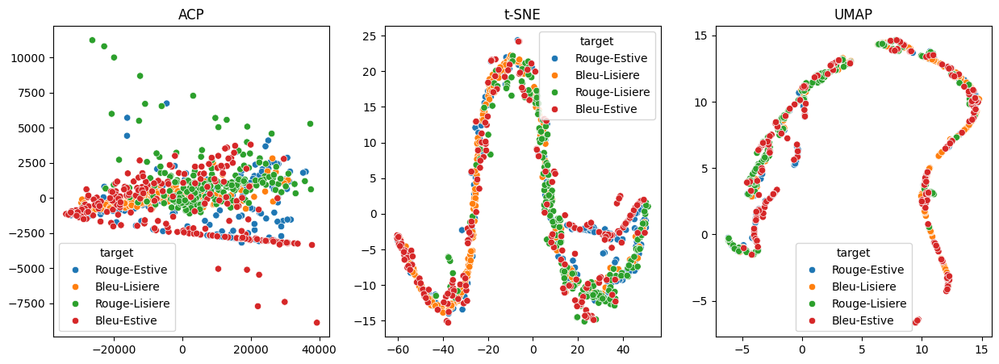

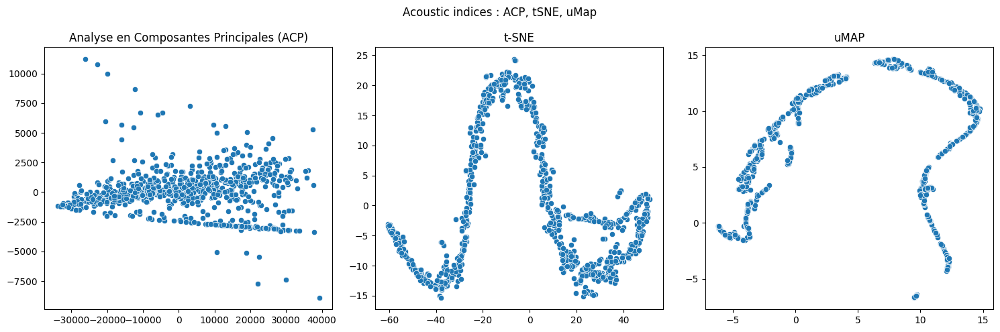

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Couflens_Saubé/Couflens_SaubéL_E_B_R_acoustic_indices.csv trouvé !


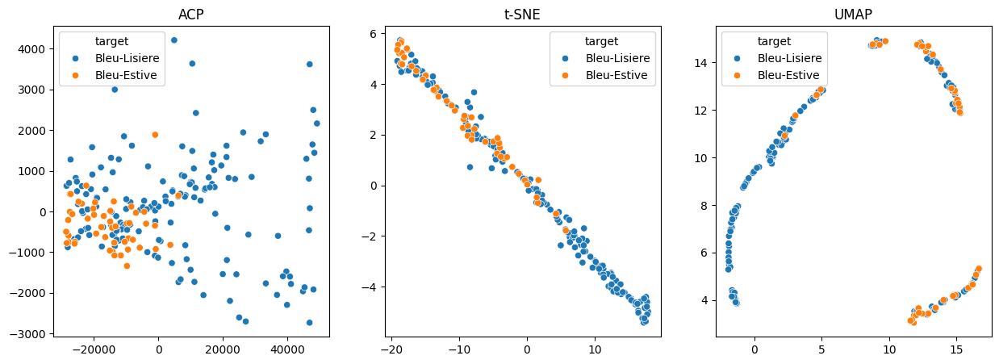

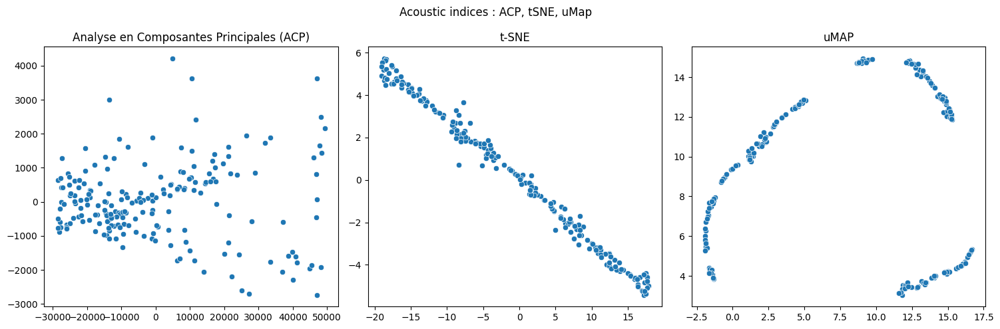

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Mijanes_Estagnet/Mijanes_EstagnetL_E_B_R_acoustic_indices.csv trouvé !


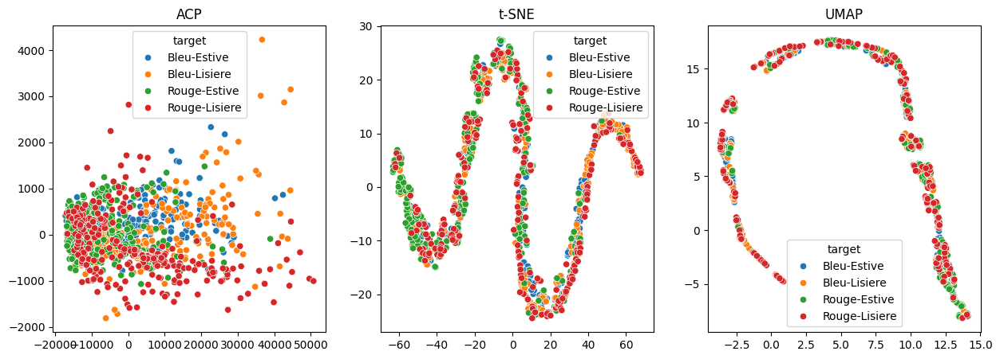

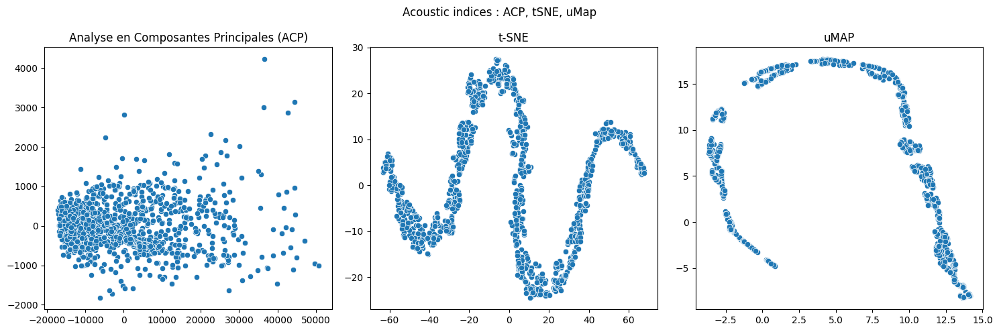

/content/gdrive/MyDrive/Valeurs acoustiques/2022/Goulier_Val_de_Sos/Goulier_Val_de_SosL_E_B_R_acoustic_indices.csv trouvé !


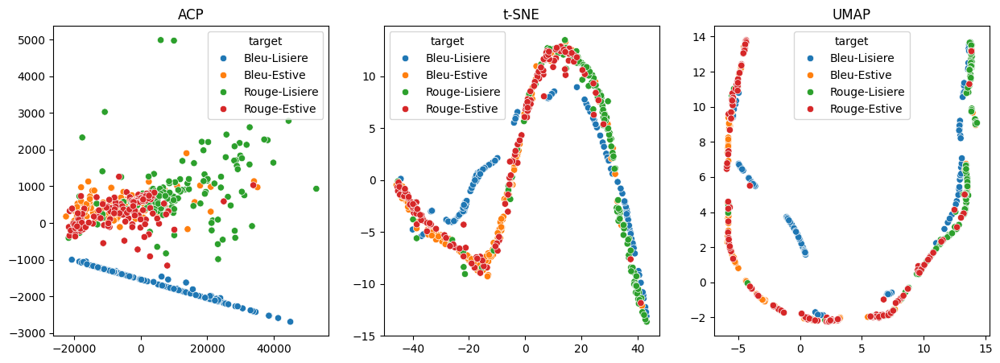

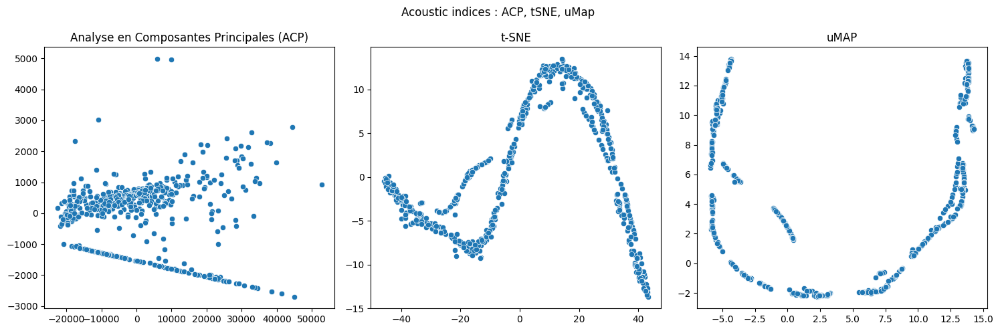

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Valcebollère_Pla_des_Salines/Valcebollère_Pla_des_SalinesL_E_B_R_acoustic_indices.csv trouvé !


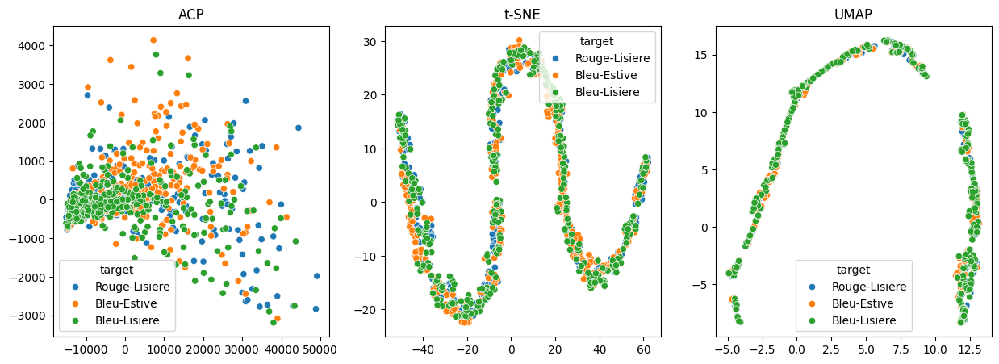

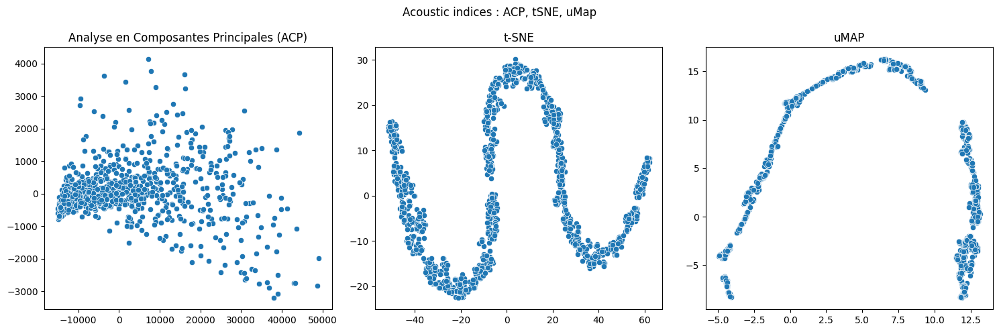

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Arrien_Pic_Midi_Bordes/Arrien_Pic_Midi_BordesL_E_B_R_acoustic_indices.csv trouvé !


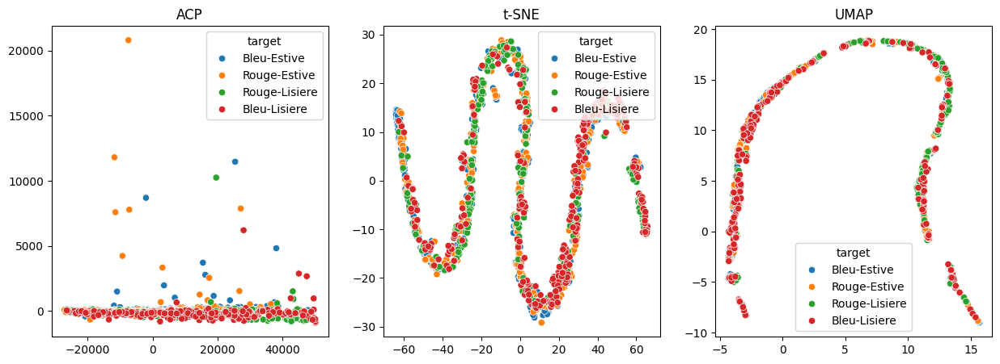

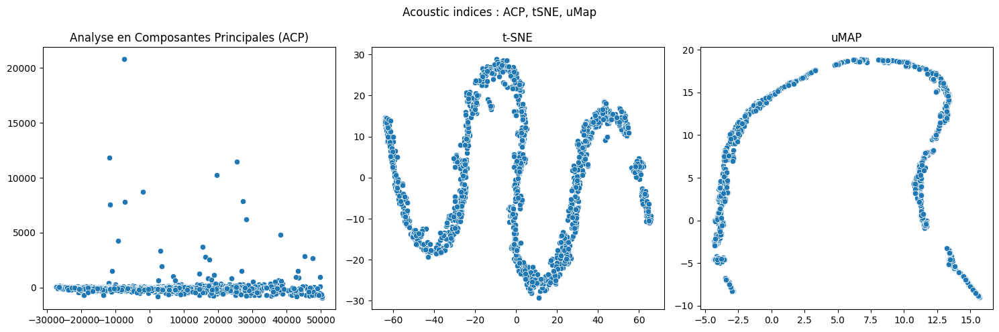

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Appy_Etang_dAppy/Appy_Etang_dAppyL_E_B_R_acoustic_indices.csv trouvé !


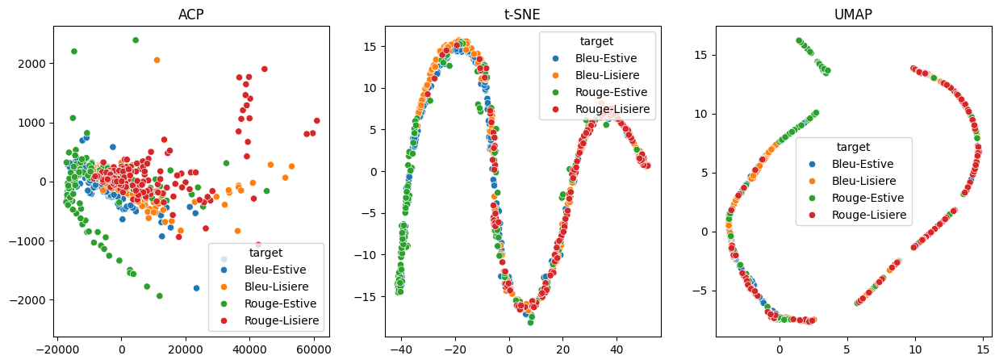

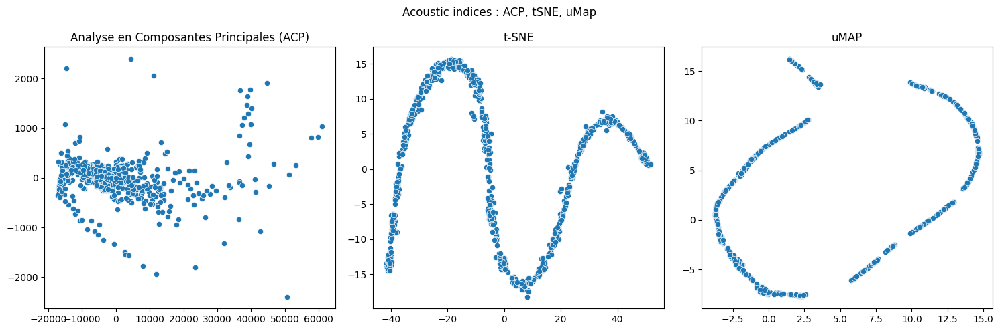

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Antras_Isard/Antras_IsardL_E_B_R_acoustic_indices.csv trouvé !


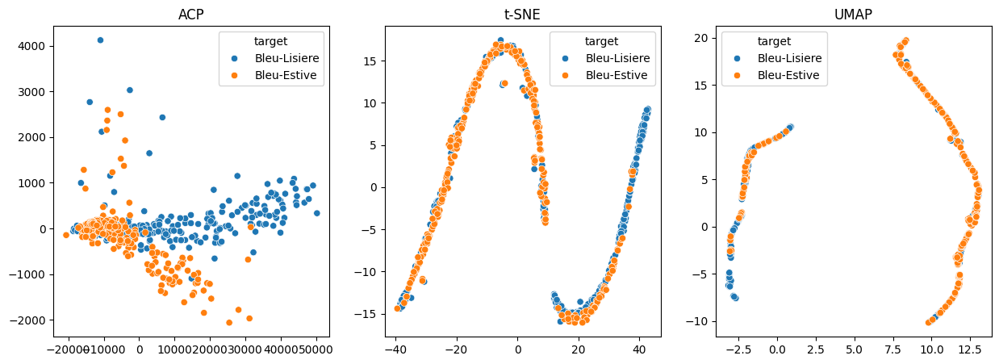

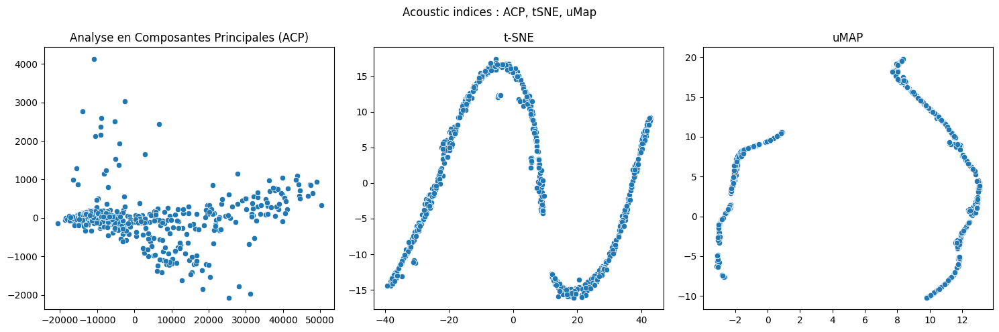

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Bethmale_Ayet/Bethmale_AyetL_E_B_R_acoustic_indices.csv trouvé !


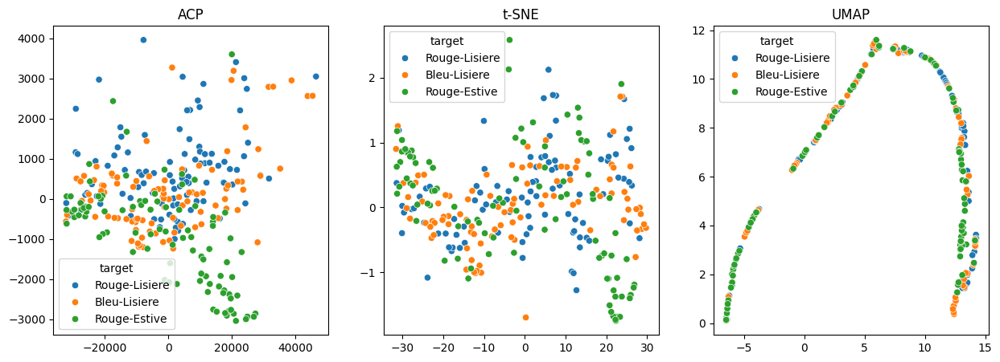

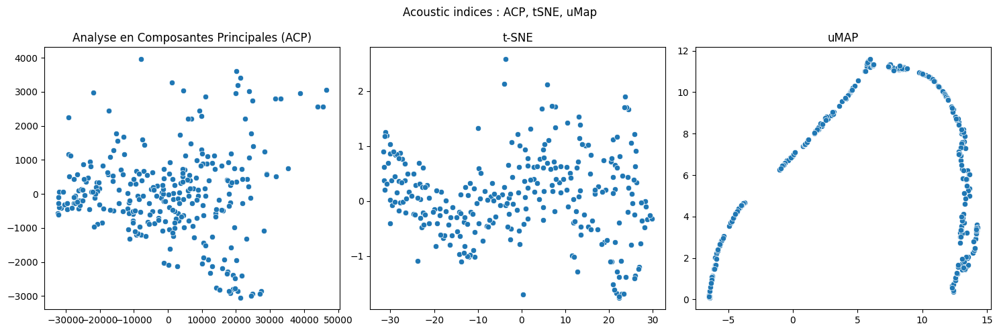

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Aston_Plateau_de_Beille/Aston_Plateau_de_BeilleL_E_B_R_acoustic_indices.csv trouvé !


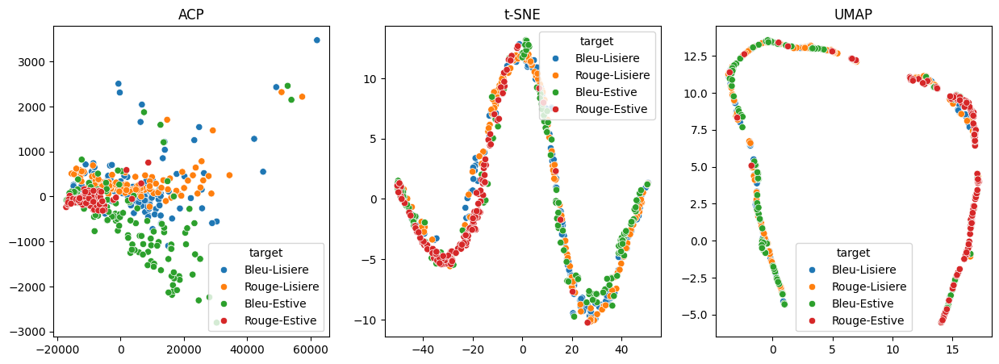

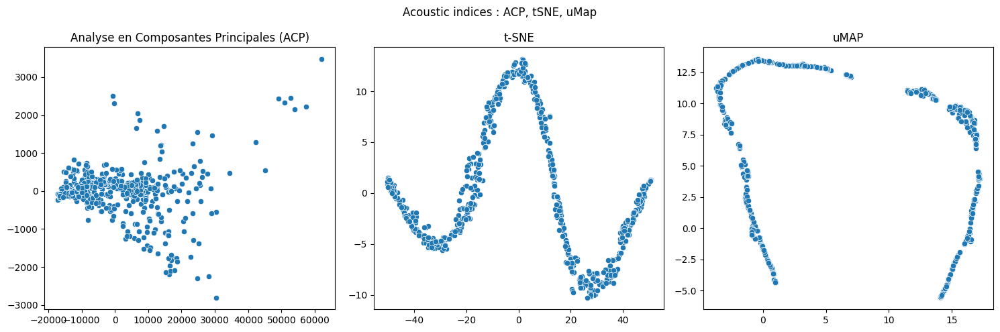

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Bonac_Arech/Bonac_ArechL_E_B_R_acoustic_indices.csv trouvé !


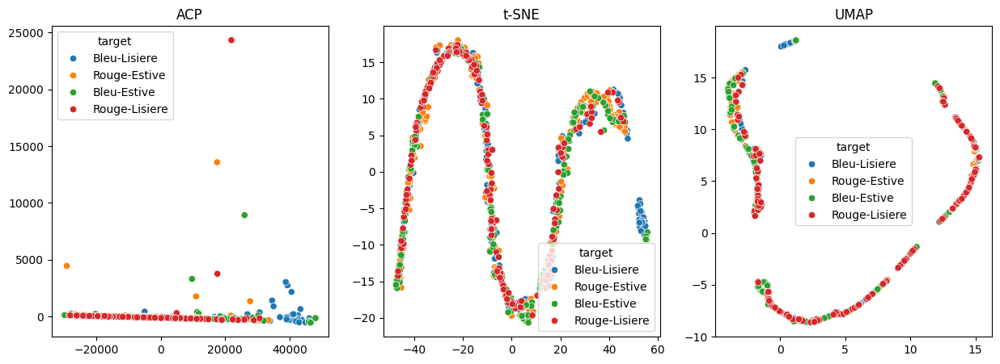

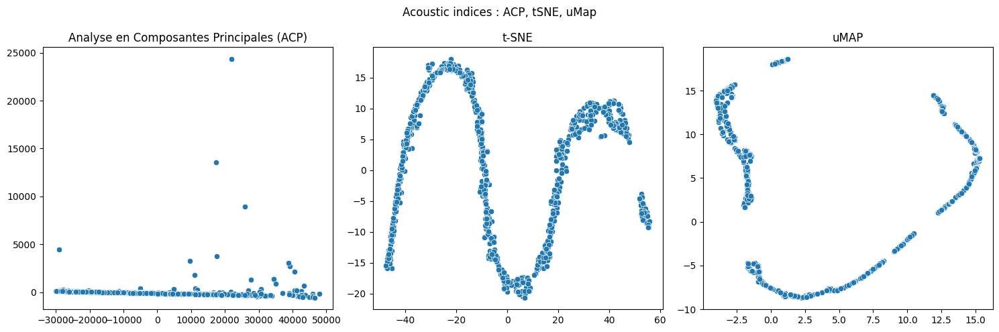

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Aulus_Turon_Rose/Aulus_Turon_RoseL_E_B_R_acoustic_indices.csv trouvé !


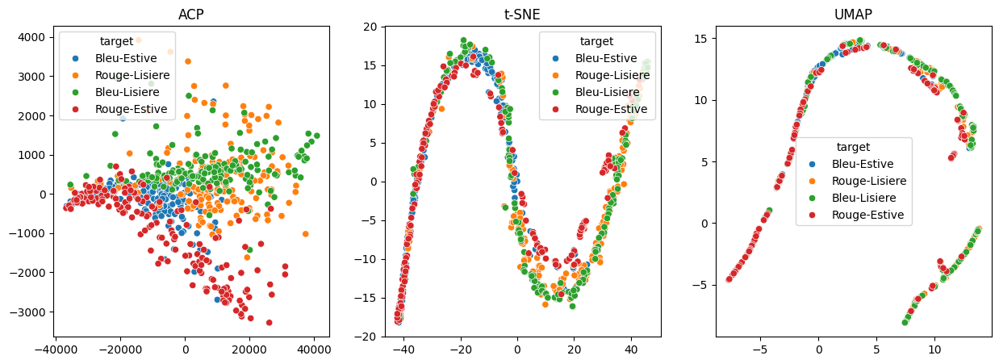

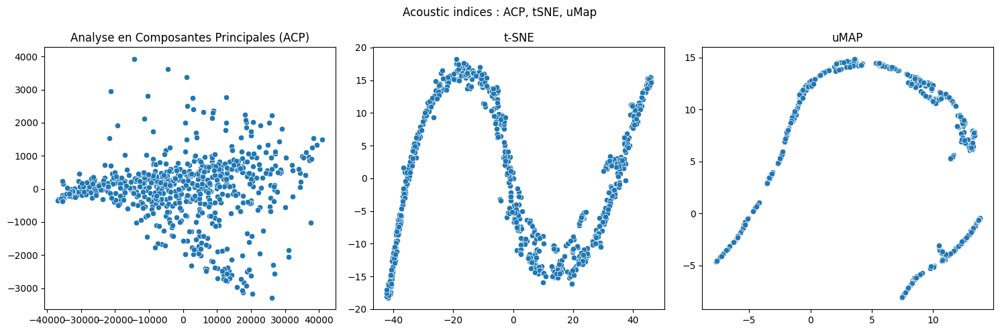

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Gestiès_Col_du_Sasc/Gestiès_Col_du_SascL_E_B_R_acoustic_indices.csv trouvé !


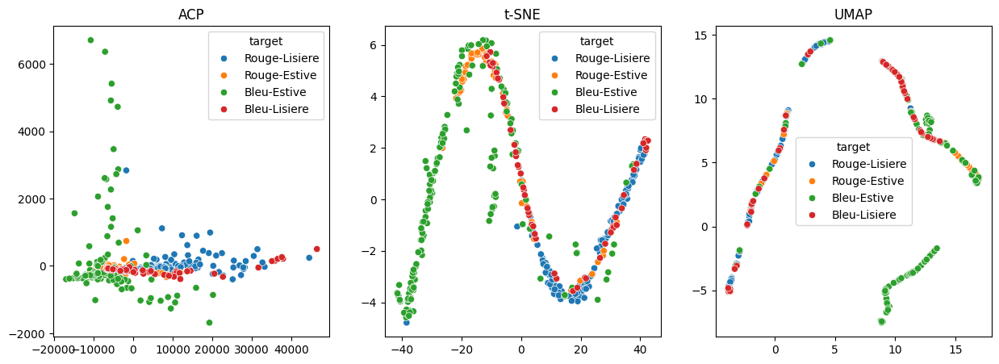

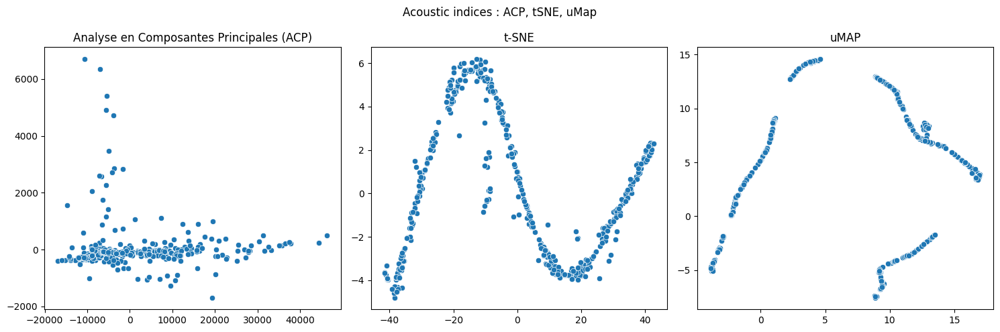

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Formiguères_Serra_dels_Alarbs/Formiguères_Serra_dels_AlarbsL_E_B_R_acoustic_indices.csv trouvé !


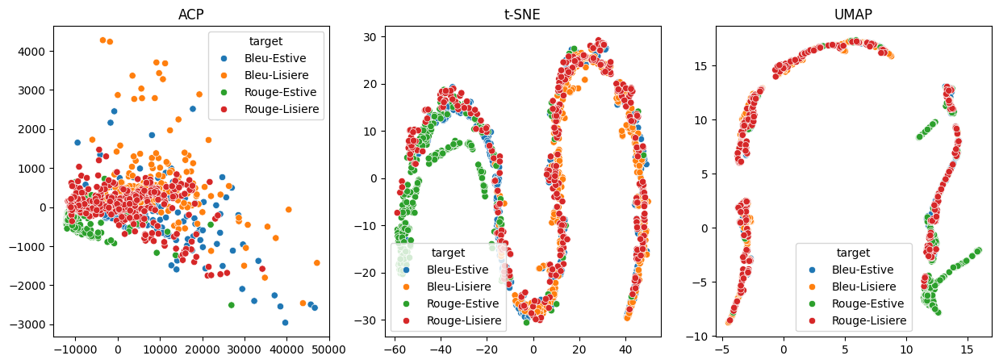

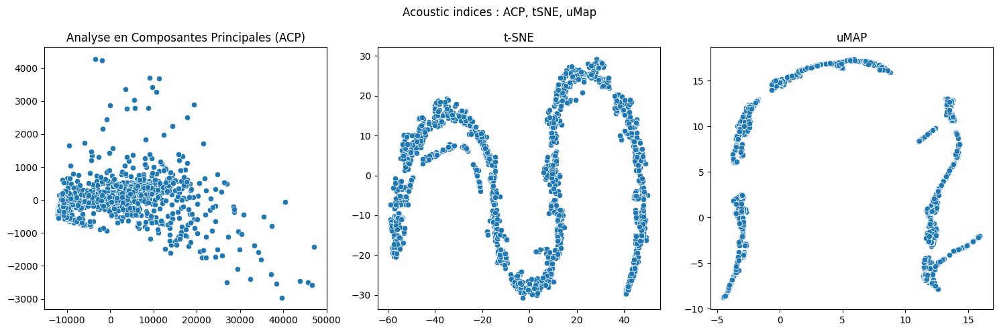

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Couflens_Pouill/Couflens_PouillL_E_B_R_acoustic_indices.csv trouvé !


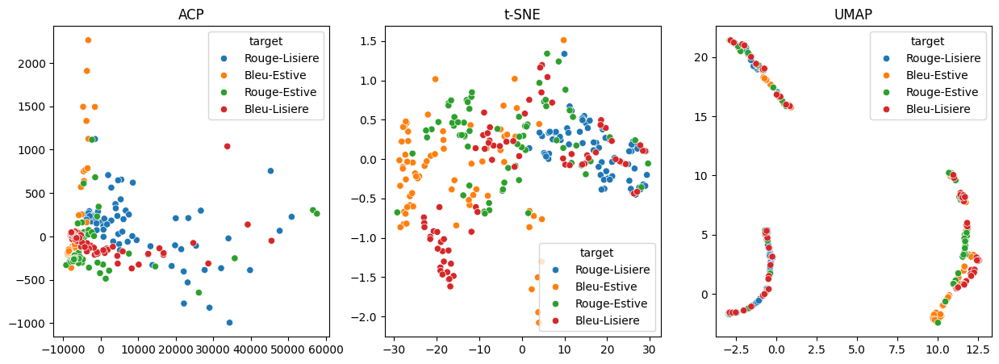

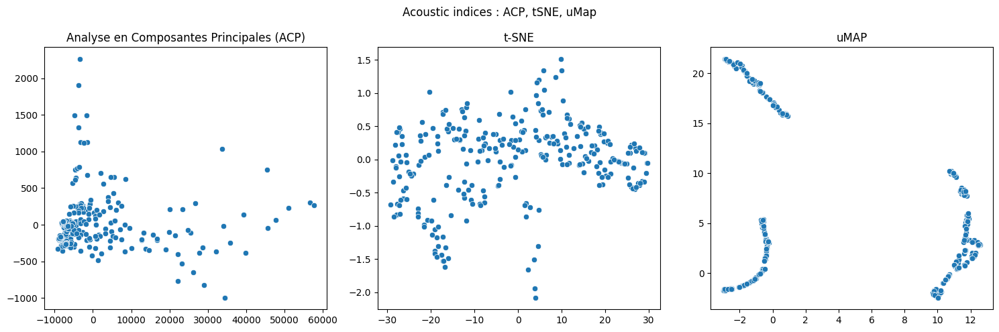

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Les_Angles_Roc_dAude/Les_Angles_Roc_dAudeL_E_B_R_acoustic_indices.csv trouvé !


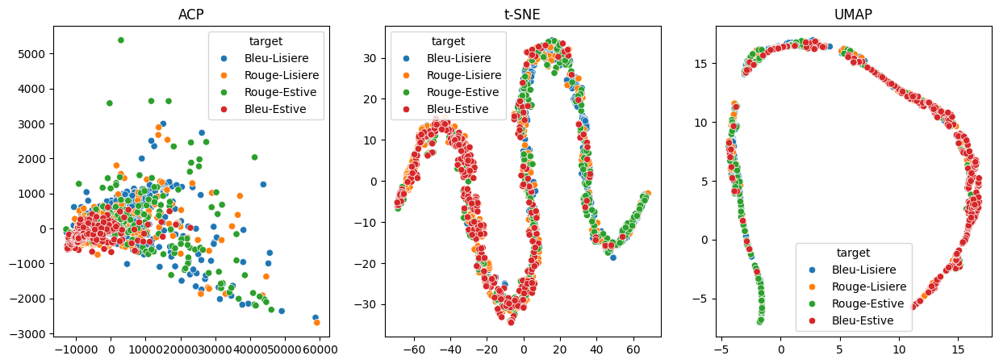

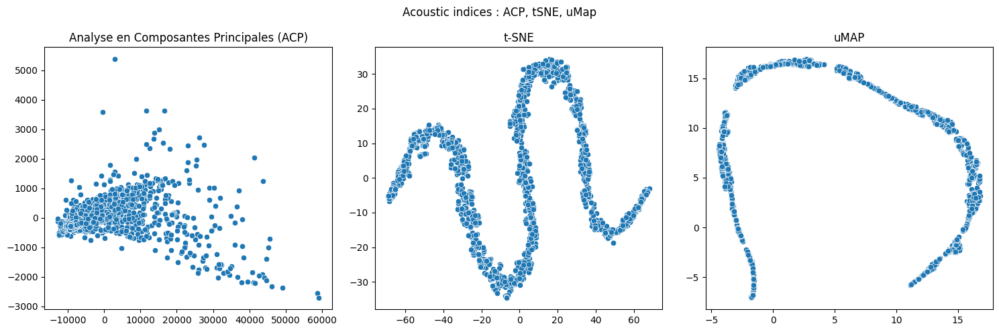

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Ustou_Col_dEscots/Ustou_Col_dEscotsL_E_B_R_acoustic_indices.csv trouvé !


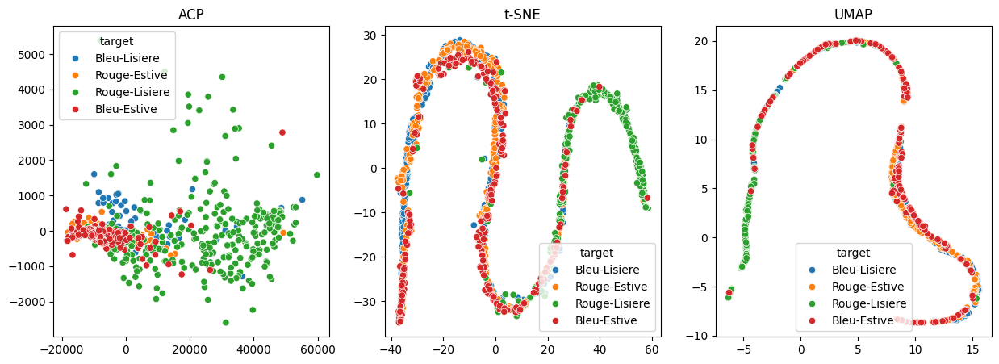

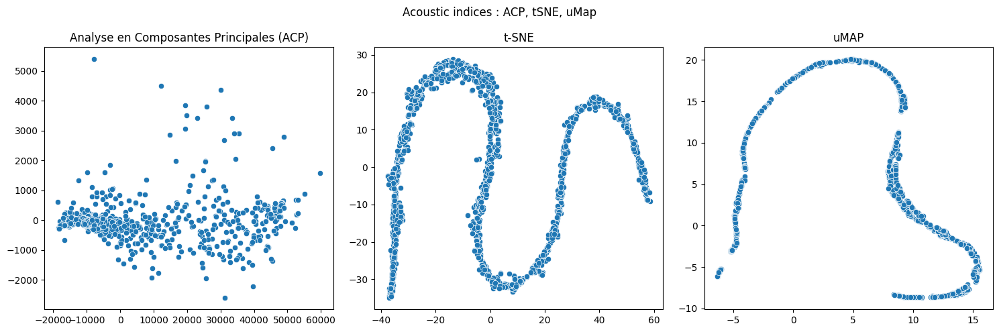

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Les_Angles_Puig_del_Pam/Les_Angles_Puig_del_PamL_E_B_R_acoustic_indices.csv trouvé !


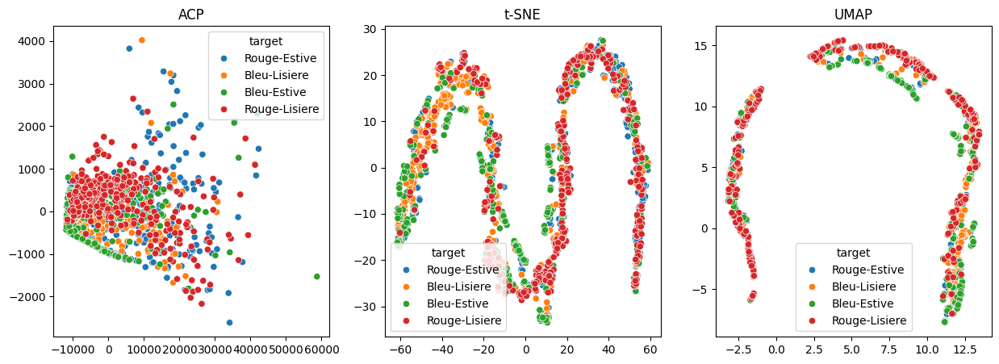

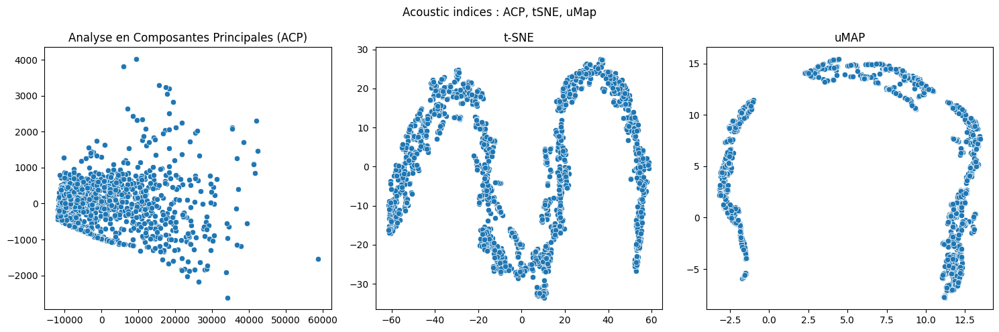

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Lercoul_Col_de_Grail/Lercoul_Col_de_GrailL_E_B_R_acoustic_indices.csv trouvé !


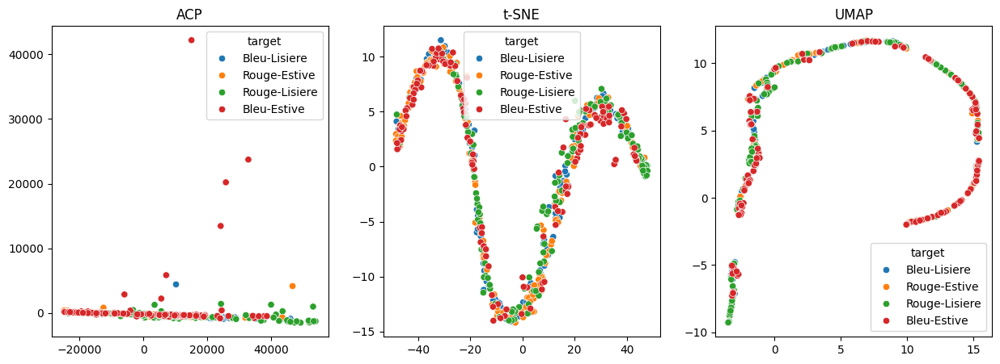

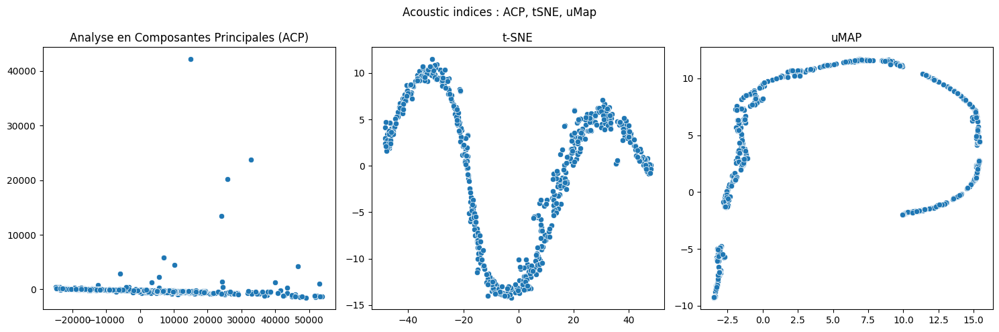

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Gestiès_Le_Clot/Gestiès_Le_ClotL_E_B_R_acoustic_indices.csv trouvé !


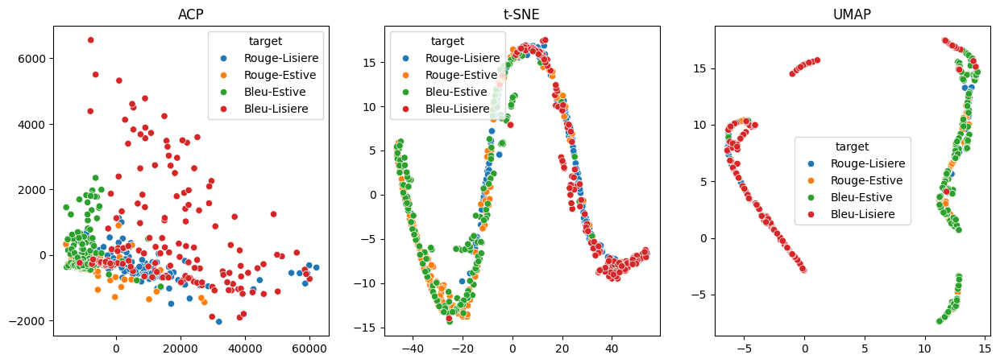

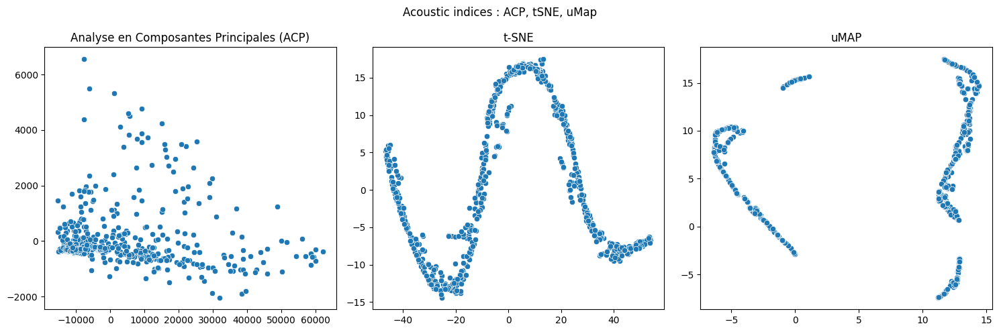

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Orlu_RNCFS/Orlu_RNCFSL_E_B_R_acoustic_indices.csv trouvé !


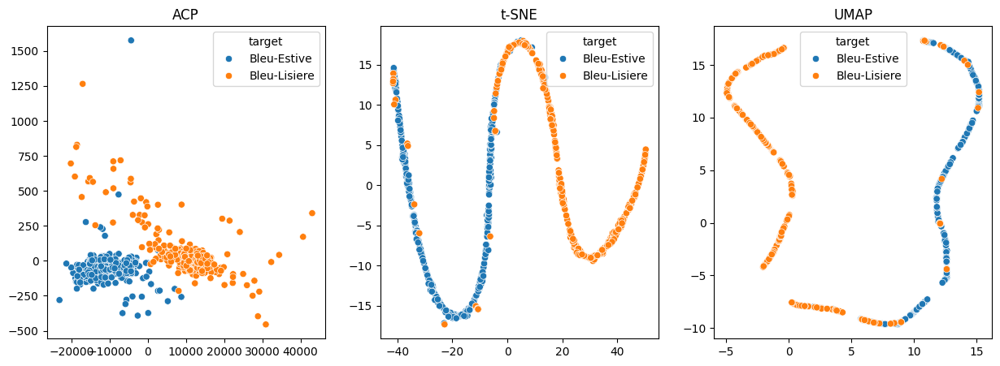

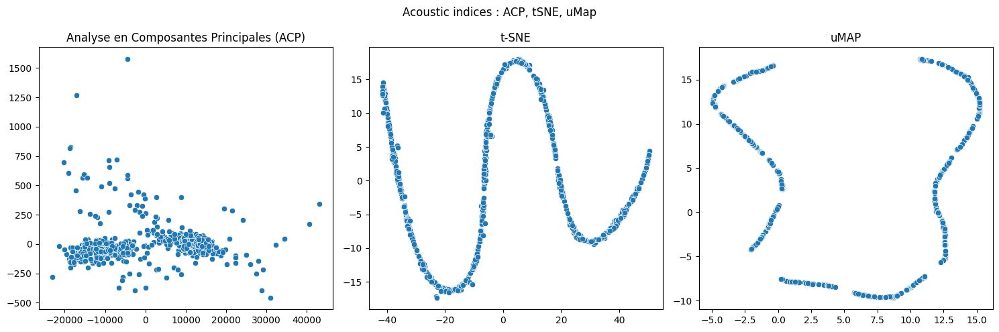

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Montferrier_Mont_dOlmes/Montferrier_Mont_dOlmesL_E_B_R_acoustic_indices.csv trouvé !


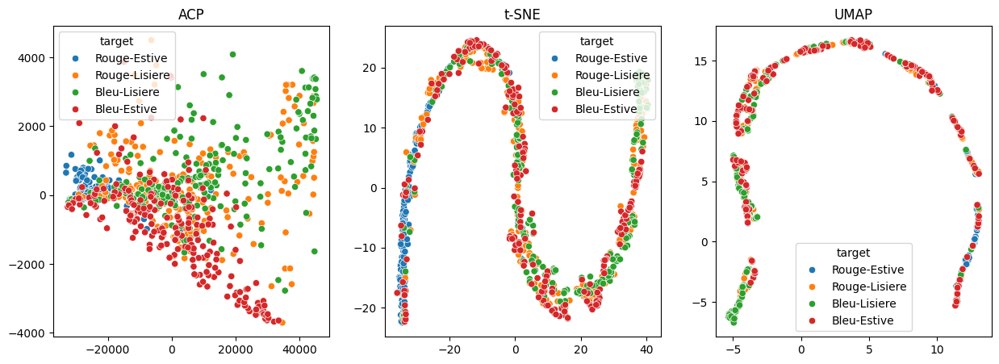

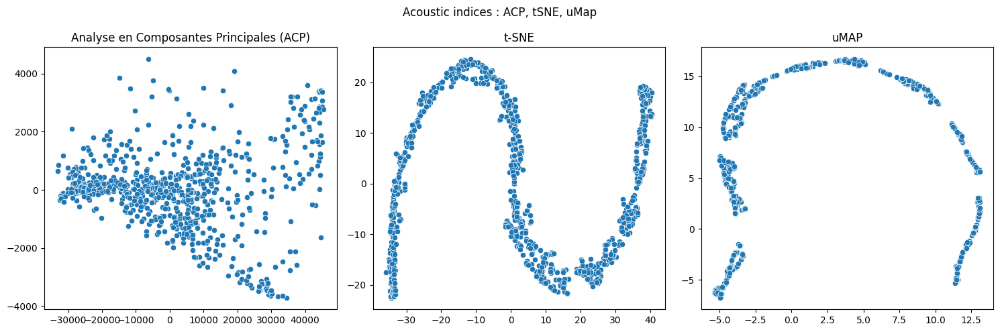

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Miglos_Pla_de_Montcamp/Miglos_Pla_de_MontcampL_E_B_R_acoustic_indices.csv trouvé !


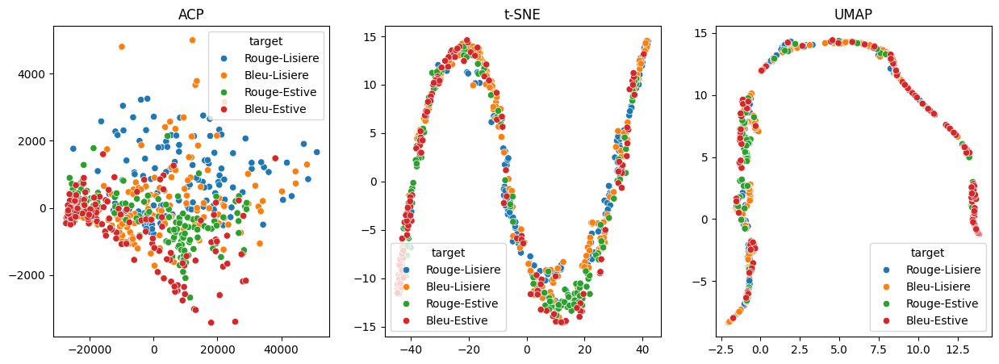

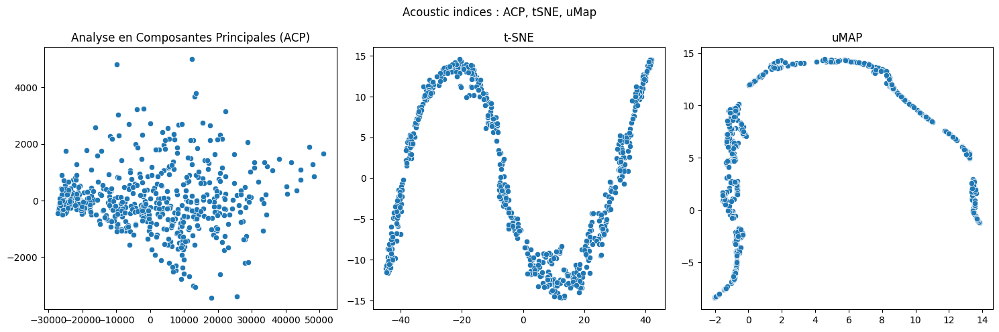

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Saint-Lary_Herbe_Soulette/Saint-Lary_Herbe_SouletteL_E_B_R_acoustic_indices.csv trouvé !


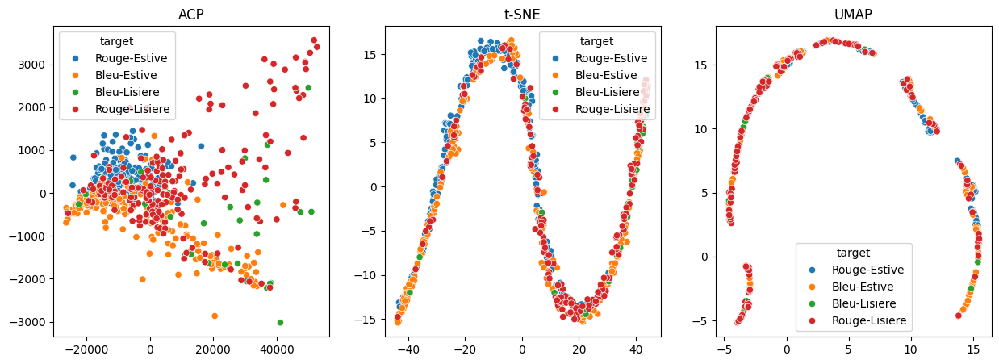

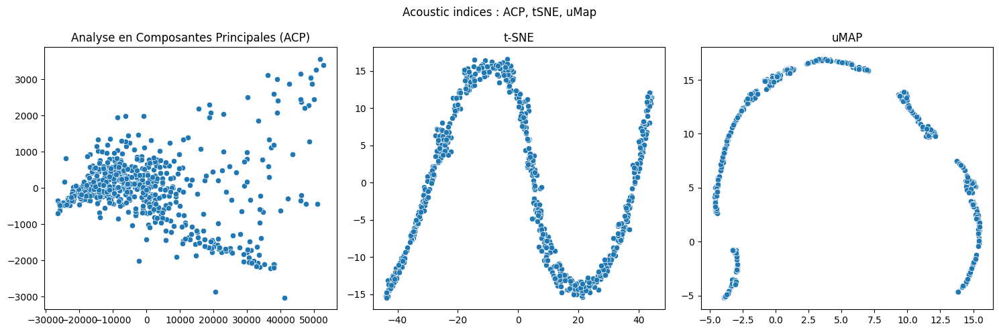

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Merens_Comte/Merens_ComteL_E_B_R_acoustic_indices.csv trouvé !


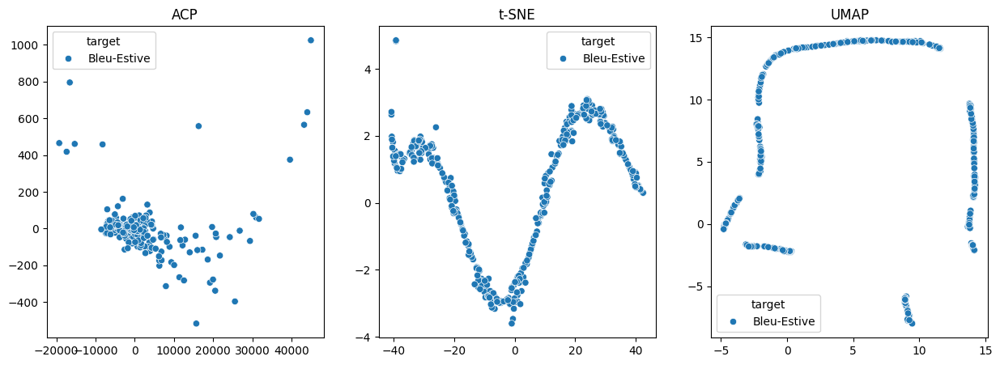

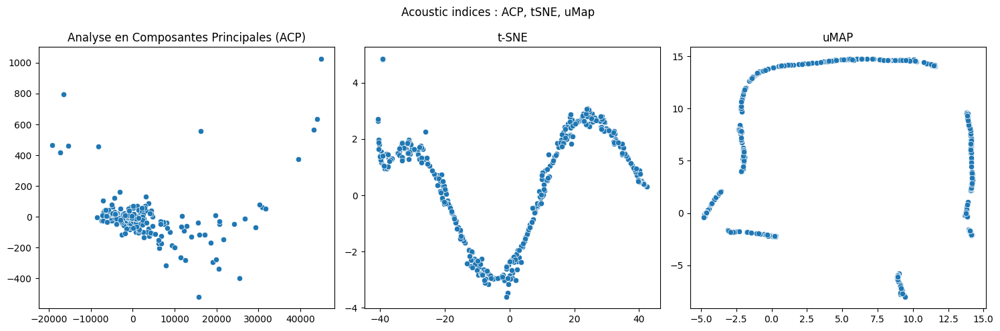

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Seix_Pic_de_Montbuou/Seix_Pic_de_MontbuouL_E_B_R_acoustic_indices.csv trouvé !


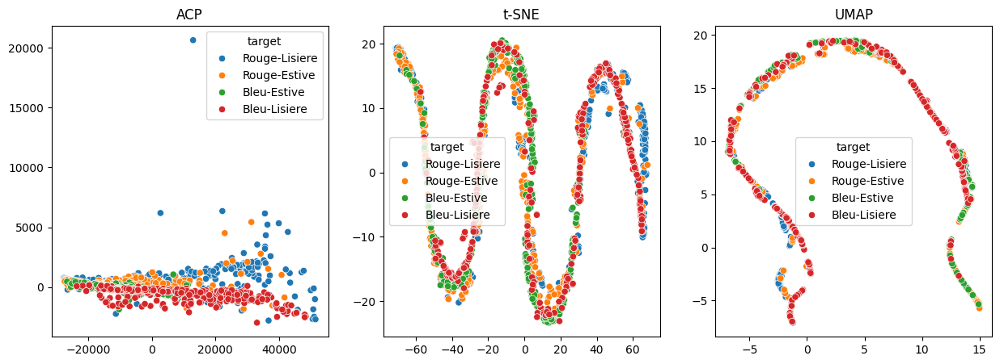

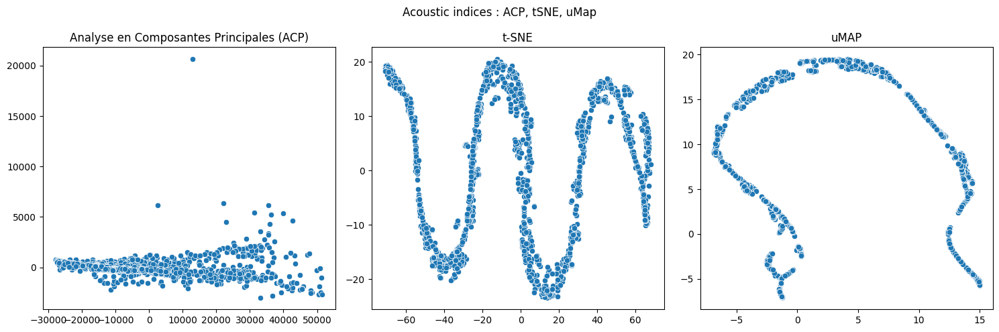

/content/gdrive/MyDrive/Valeurs acoustiques/2023/Montsegur_Frau/Montsegur_FrauL_E_B_R_acoustic_indices.csv trouvé !


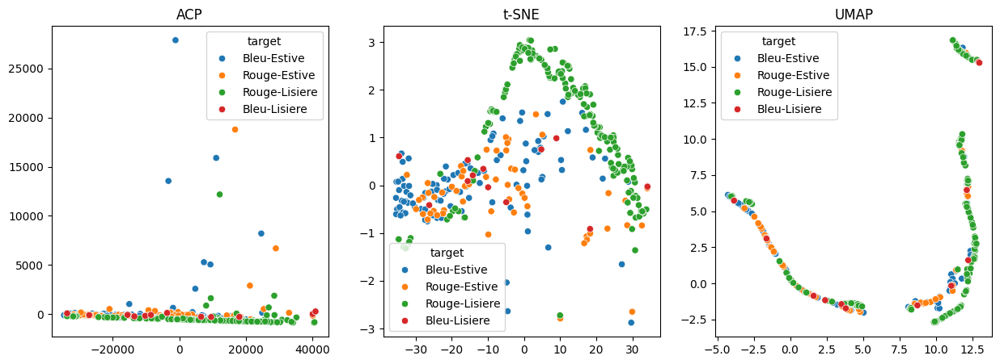

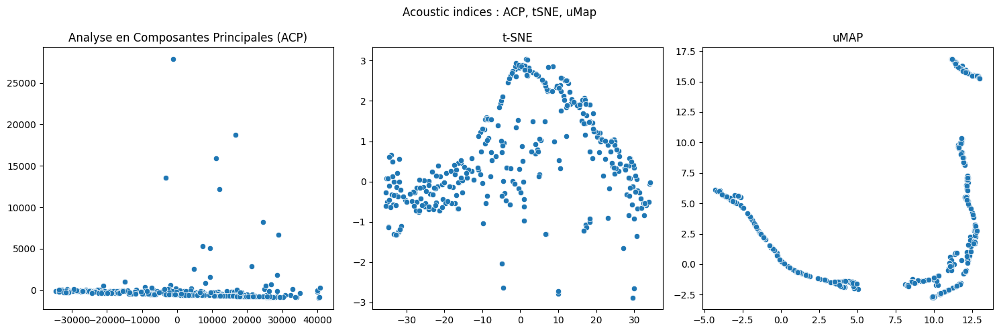

In [ ]:
for annee in annees:
    chemin_annee = os.path.join(dossier_valeurs_acoustiques, annee)

    # Parcourir les dossiers feuilles
    for dossier_parent in os.listdir(chemin_annee):
        chemin_dossier_parent = os.path.join(chemin_annee, dossier_parent)

        chemin_fichier_csv = os.path.join(chemin_dossier_parent,dossier_parent+"L_E_B_R_acoustic_indices.csv")

        if os.path.isfile(chemin_fichier_csv):
            print(chemin_fichier_csv+" trouvé !")

            df = pd.read_csv(chemin_fichier_csv)

            # --------
            df_fn_sn = df[['file_name', 'station_name']].copy()

            df.drop(columns=["Unnamed: 0", "file_name", "station_name"], inplace= True)

            # --------

            # Instancier LabelEncoder
            label_encoder = LabelEncoder()

            # Initialiser un dictionnaire pour stocker les correspondances
            label_mapping = {}

            # Appliquer LabelEncoding aux colonnes qualitatives
            qualitative_cols = ['dynamique', 'position']
            for col in qualitative_cols:
                df[col] = label_encoder.fit_transform(df[col])
                # Stocker les correspondances dans le dictionnaire
                label_mapping[col] = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

            # # Afficher le dictionnaire de correspondance
            # print("Dictionnaire de correspondance des labels :")
            # for col, mapping in label_mapping.items():
            #     print(f"{col}: {mapping}")

            # # Afficher le DataFrame après les modifications
            # print("\nDataFrame après les modifications :")
            # df.head(2).T

            # --------

            df_dy_po = df[['dynamique', 'position']].copy()

            # --------

            df.drop(columns=["dynamique", "position"], inplace= True)

            # --------

            # Remplacer les NaN par la moyenne de chaque colonne respective
            df = df.apply(lambda col: col.fillna(col.mean()))

            # --------

            # ACP
            pca = PCA(n_components=2)
            pca_result = pca.fit_transform(df)

            # t-SNE
            tsne = TSNE(n_components=2, perplexity=5)
            tsne_result = tsne.fit_transform(df)

            # uMAP
            umap_result = UMAP(n_components=2).fit_transform(df)

            # --------

            df["target"] = df_dy_po['dynamique'].astype(str) + df_dy_po['position'].astype(str)


            # --------

            # dynamique: {'Bleu': 0, 'Rouge': 1}
            # position: {'E': 0, 'L': 1}

            dy_po = {'00':'Bleu-Estive', '01':'Bleu-Lisiere', '10':'Rouge-Estive','11':'Rouge-Lisiere'}

            # --------

            # Remplacer les codes par les noms correspondants
            df['target'] = df['target'].map(dy_po)

            # ACP (Analyse en Composantes Principales)
            pca = PCA(n_components=2)
            pca_result = pca.fit_transform(df.drop('target', axis=1))

            # t-SNE (t-distributed Stochastic Neighbor Embedding)
            tsne = TSNE(n_components=2, random_state=42)
            tsne_result = tsne.fit_transform(df.drop('target', axis=1))

            # UMAP (Uniform Manifold Approximation and Projection)
            umap_result = umap.UMAP().fit_transform(df.drop('target', axis=1))

            # Affichage des résultats
            plt.figure(figsize=(15, 5))

            # ACP
            plt.subplot(1, 3, 1)
            sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=df['target'])
            plt.title('ACP')

            # t-SNE
            plt.subplot(1, 3, 2)
            sns.scatterplot(x=tsne_result[:, 0], y=tsne_result[:, 1], hue=df['target'])
            plt.title('t-SNE')

            # UMAP
            plt.subplot(1, 3, 3)
            sns.scatterplot(x=umap_result[:, 0], y=umap_result[:, 1], hue=df['target'])
            plt.title('UMAP')

            plt.savefig("/content/gdrive/MyDrive/Valeurs acoustiques/"+annee+"/"+dossier_parent+"/Colored_acoustic_indices_acp_tsne_umap_L_E_B_R.png")
            plt.show()

            # -----------

            # Créer un tracé avec 3 sous-tracés (subplots)
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))

            # Affichage des résultats de l'ACP sur le premier subplot
            sns.scatterplot(x=pca_result[:,0], y=pca_result[:,1], ax=axes[0])
            axes[0].set_title('Analyse en Composantes Principales (ACP)')

            # Affichage des résultats de t-SNE sur le deuxième subplot
            sns.scatterplot(x=tsne_result[:,0], y=tsne_result[:,1], ax=axes[1])
            axes[1].set_title('t-SNE')

            # Affichage des résultats de uMAP sur le troisième subplot
            sns.scatterplot(x=umap_result[:,0], y=umap_result[:,1], ax=axes[2])
            axes[2].set_title('uMAP')

            # Ajouter un titre global au tracé
            plt.suptitle('Acoustic indices : ACP, tSNE, uMap')

            # Afficher le tracé avec les sous-tracés
            plt.tight_layout()
            plt.savefig("/content/gdrive/MyDrive/Valeurs acoustiques/"+annee+"/"+dossier_parent+"/acoustic_indices_acp_tsne_umap_L_E_B_R.png")
            plt.show()